In [2]:
from pprint import pprint
import sys

from PIL import Image
import albumentations as A
import art.attacks.evasion
from art.estimators.object_detection import PyTorchFasterRCNN
from datasets import load_dataset
import jatic_toolbox
from jatic_toolbox import __version__ as jatic_version
from jatic_toolbox.interop.huggingface import HuggingFaceObjectDetectionDataset
import numpy as np

from armory.art_experimental.attacks.patch import AttackWrapper
from armory.metrics.compute import BasicProfiler
import armory.version
from charmory.data import JaticObjectDetectionDatasetGenerator
from charmory.engine import LightningEngine
from charmory.evaluation import Attack, Dataset, Evaluation, Metric, Model, SysConfig
from charmory.tasks.object_detection import ObjectDetectionTask
from charmory.track import track_init_params, track_params
from charmory.utils import (
    adapt_jatic_object_detection_model_for_art,
    create_jatic_image_classification_dataset_transform,
)

BATCH_SIZE = 4
TRAINING_EPOCHS = 20
import torch

In [3]:
def load_huggingface_dataset():
    train_data = load_dataset("Honaker/xview_dataset", split="train")

    new_dataset = train_data.train_test_split(test_size=0.2, seed=1)
    train_dataset, test_dataset = new_dataset["train"], new_dataset["test"]

    train_dataset, test_dataset = HuggingFaceObjectDetectionDataset(
        train_dataset
    ), HuggingFaceObjectDetectionDataset(test_dataset)

    return train_dataset, test_dataset
train_dataset, test_dataset = load_huggingface_dataset()


2023-09-14 13:28:32  3s WARNING  datasets.builder:download_and_prepare:835 Found cached dataset parquet (/home/chris/.cache/huggingface/datasets/Honaker___parquet/Honaker--xview_dataset-4b2c80dc283ac8d5/0.0.0/14a00e99c0d15a23649d0db8944380ac81082d4b021f398733dd84f3a6c569a7)
2023-09-14 13:28:32  3s WARNING  datasets.arrow_dataset:train_test_split:4461 Loading cached split indices for dataset at /home/chris/.cache/huggingface/datasets/Honaker___parquet/Honaker--xview_dataset-4b2c80dc283ac8d5/0.0.0/14a00e99c0d15a23649d0db8944380ac81082d4b021f398733dd84f3a6c569a7/cache-f11336e16ab8bfa4.arrow and /home/chris/.cache/huggingface/datasets/Honaker___parquet/Honaker--xview_dataset-4b2c80dc283ac8d5/0.0.0/14a00e99c0d15a23649d0db8944380ac81082d4b021f398733dd84f3a6c569a7/cache-bdead7623423d050.arrow


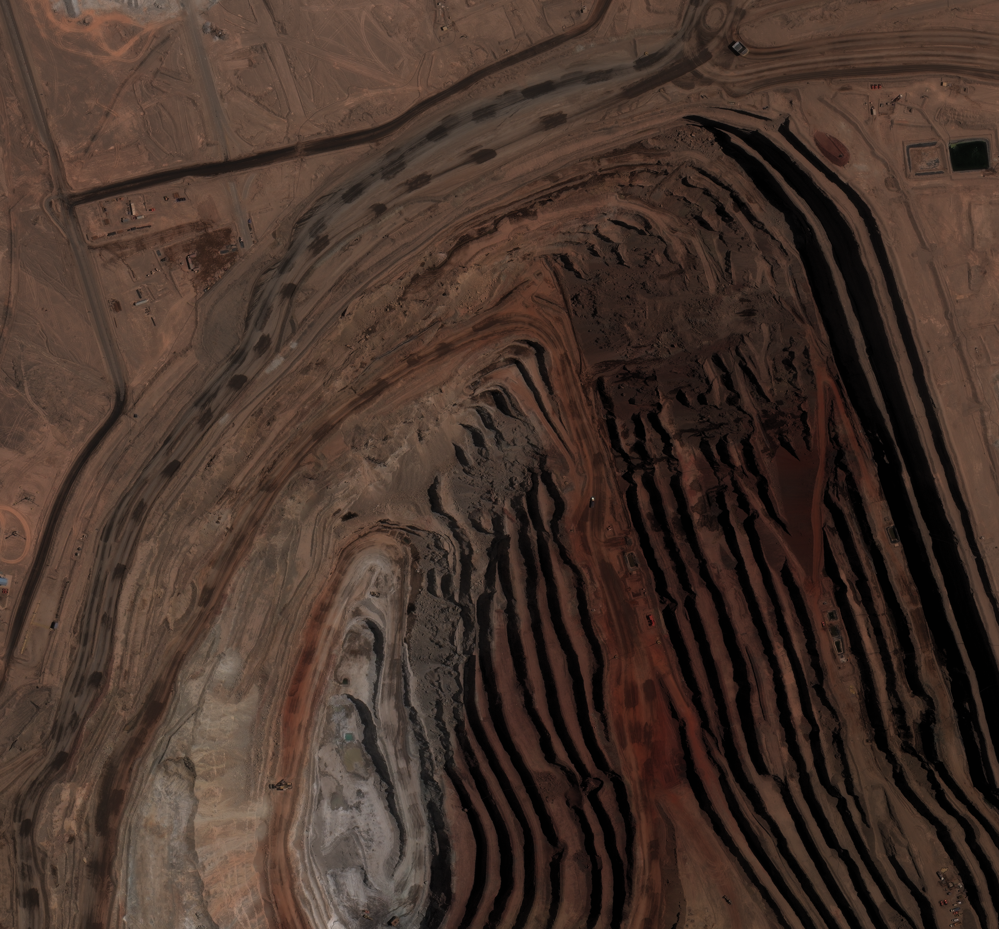

In [4]:
train_dataset[0]['image']

In [5]:
from pathlib import Path

import torch
import torchvision
import torchvision.transforms as T
from art.estimators.object_detection import PyTorchFasterRCNN
from armory.baseline_models.pytorch.carla_single_modality_object_detection_frcnn import get_art_model


class Demo:
  def __init__(self, device, images, checkpoint):
    self.device = device
    self.images = images
    self.model = self.load_model(checkpoint).model

  def load_model(self, checkpoint):
    return get_art_model(
        model_kwargs = {"num_classes": 63},
        wrapper_kwargs = {},
        weights_path = "/home/chris/armory/examples/src/charmory_examples/xview_model_state_dict_epoch_99_loss_0p67",
        )

  @torch.no_grad()
  def detect(self, image):
    for img in image:
      transform = T.Compose([T.Resize((960, 1280)), T.ToTensor()])
      image_tensor = transform(img).unsqueeze(0).to(self.device)
      print(image_tensor.shape)

      return self.model(image_tensor)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
output_directory = Path(f"/.armory/outputs/test_xview")
output_dataset = train_dataset
#output_images = list(Path(output_directory / "saved_samples").glob("*.png"))
output_images = train_dataset[0]['image']
output_checkpoint = Path("/home/chris/armory/examples/src/charmory_examples/xview_model_state_dict_epoch_99_loss_0p67")

demo = Demo(device, output_images, output_checkpoint)

In [6]:
from huggingface_hub import notebook_login

In [7]:
notebook_login()

In [14]:
#demo.model._save_to_state_dict('xview_model.pt')

TypeError: Module._save_to_state_dict() missing 2 required positional arguments: 'prefix' and 'keep_vars'

In [ ]:
torch.save(demo.model, 'xview_model.pt')

In [15]:
train_dataset[:4]['image']

[<PIL.TiffImagePlugin.TiffImageFile image mode=RGB size=2978x2769>,
 <PIL.TiffImagePlugin.TiffImageFile image mode=RGB size=3290x3217>,
 <PIL.TiffImagePlugin.TiffImageFile image mode=RGB size=3331x3275>,
 <PIL.TiffImagePlugin.TiffImageFile image mode=RGB size=3227x3223>]

In [25]:
metric = demo.detect(train_dataset[0]['image'])

TypeError: 'TiffImageFile' object is not iterable

In [36]:
metric[0].keys()

dict_keys(['boxes', 'labels', 'scores'])

In [34]:
metric[0]['labels']

tensor([54, 58, 58, 41, 49, 54, 54, 54, 58, 54, 57, 54, 53,  3, 58, 57, 58,  6,
        58, 41, 59, 57, 58, 10, 62, 54, 50, 20, 54, 54, 58, 54],
       device='cuda:0')

In [35]:
metric[0]['scores']

tensor([0.7461, 0.7023, 0.5958, 0.5228, 0.4376, 0.3186, 0.3089, 0.2631, 0.2488,
        0.2466, 0.2101, 0.1797, 0.1772, 0.1418, 0.1331, 0.1276, 0.1173, 0.1166,
        0.1063, 0.0885, 0.0784, 0.0780, 0.0778, 0.0745, 0.0745, 0.0743, 0.0695,
        0.0680, 0.0626, 0.0535, 0.0519, 0.0500], device='cuda:0')

In [27]:
len(metric[0])

3